In [1]:
#downloading the dataset from opendatasets
import os
import opendatasets as od 

In [2]:
Rwand = 'https://kaggle.com/competitions/playground-series-s3e20'
od.download(Rwand)

Skipping, found downloaded files in ".\playground-series-s3e20" (use force=True to force download)


In [3]:
os.listdir('playground-series-s3e20')

['sample_submission.csv', 'test.csv', 'train.csv']

**Predicting CO2 Emissions**
The ability to accurately monitor carbon emissions is a critical step in the fight against climate change. Precise carbon readings allow researchers and governments to understand the sources and patterns of carbon mass output. While Europe and North America have extensive systems in place to monitor carbon emissions on the ground, there are few available in Africa.

The objective of this challenge is to create a machine learning models using open-source CO2 emissions data from Sentinel-5P satellite observations to predict future carbon emissions.

These solutions may help enable governments, and other actors to estimate carbon emission levels across Africa, even in places where on-the-ground monitoring is not possible.

**Dataset Description**
The objective of this challenge is to create machine learning models that use open-source emissions data (from Sentinel-5P satellite observations) to predict carbon emissions.

Approximately 497 unique locations were selected from multiple areas in Rwanda, with a distribution around farm lands, cities and power plants. The data for this competition is split by time; the years 2019 - 2021 are included in the training data, and your task is to predict the CO2 emissions data for 2022 through November.

Seven main features were extracted weekly from Sentinel-5P from January 2019 to November 2022. Each feature (Sulphur Dioxide, Carbon Monoxide, etc) contain sub features such as column_number_density which is the vertical column density at ground level, calculated using the DOAS technique. You can read more about each feature in the below links, including how they are measured and variable definitions. You are given the values of these features in the test set and your goal to predict CO2 emissions using time information as well as these features.

Sulphur Dioxide - COPERNICUS/S5P/NRTI/L3_SO2
Carbon Monoxide - COPERNICUS/S5P/NRTI/L3_CO
Nitrogen Dioxide - COPERNICUS/S5P/NRTI/L3_NO2
Formaldehyde - COPERNICUS/S5P/NRTI/L3_HCHO
UV Aerosol Index - COPERNICUS/S5P/NRTI/L3_AER_AI
Ozone - COPERNICUS/S5P/NRTI/L3_O3
Cloud - COPERNICUS/S5P/OFFL/L3_CLOUD

# 1. LOADING THE DATASET

In [4]:
# Reading the files to train-df, test_df and sub_df
import pandas as pd
import numpy as np

train_df = pd.read_csv('playground-series-s3e20/train.csv')
test_df = pd.read_csv('playground-series-s3e20/test.csv')
sub_df = pd.read_csv('playground-series-s3e20/sample_submission.csv')

# droppping duplicates from both training and testing data
train_df.drop_duplicates(inplace=True)
test_df.drop_duplicates(inplace=True)
train_df.reset_index(drop=True)
test_df.reset_index(drop=True)

# getting a glance of what the data looks like
train_df.tail()

,ID_LAT_LON_YEAR_WEEK,latitude,longitude,year,week_no,SulphurDioxide_SO2_column_number_density,SulphurDioxide_SO2_column_number_density_amf,SulphurDioxide_SO2_slant_column_number_density,SulphurDioxide_cloud_fraction,SulphurDioxide_sensor_azimuth_angle,...,Cloud_cloud_top_height,Cloud_cloud_base_pressure,Cloud_cloud_base_height,Cloud_cloud_optical_depth,Cloud_surface_albedo,Cloud_sensor_azimuth_angle,Cloud_sensor_zenith_angle,Cloud_solar_azimuth_angle,Cloud_solar_zenith_angle,emission
79018,ID_-3.299_30.301_2021_48,-3.299,30.301,2021,48,0.000284,1.195643,0.000340,0.191313,72.820518,...,5459.185355,60657.101913,4590.879504,20.245954,0.304797,-35.140368,40.113533,-129.935508,32.095214,29.404171
79019,ID_-3.299_30.301_2021_49,-3.299,30.301,2021,49,0.000083,1.130868,0.000063,0.177222,-12.856753,...,5606.449457,60168.191528,4659.130378,6.104610,0.314015,4.667058,47.528435,-134.252871,30.771469,29.186497
79020,ID_-3.299_30.301_2021_50,-3.299,30.301,2021,50,NaN,NaN,NaN,NaN,NaN,...,6222.646776,56596.027209,5222.646823,14.817885,0.288058,-0.340922,35.328098,-134.731723,30.716166,29.131205
79021,ID_-3.299_30.301_2021_51,-3.299,30.301,2021,51,-0.000034,0.879397,-0.000028,0.184209,-100.344827,...,7896.456885,46533.348194,6946.858022,32.594768,0.274047,8.427699,48.295652,-139.447849,29.112868,28.125792
79022,ID_-3.299_30.301_2021_52,-3.299,30.301,2021,52,-0.000091,0.871951,-0.000079,0.000000,76.825638,...,7553.295016,47771.681887,6553.295018,19.464032,0.226276,-12.808528,47.923441,-136.299984,30.246387,27.239302


### from the above, we can clearly see that we are dealing with numeric data 

In [5]:
#getting the shapes of the data to see how big the data is
train_df.shape, test_df.shape

((79023, 76), (24353, 75))

In [6]:
train_df.isna().any(), train_df.isna().any()#checking for missing values

(ID_LAT_LON_YEAR_WEEK          False
 latitude                      False
 longitude                     False
 year                          False
 week_no                       False
                               ...  
 Cloud_sensor_azimuth_angle     True
 Cloud_sensor_zenith_angle      True
 Cloud_solar_azimuth_angle      True
 Cloud_solar_zenith_angle       True
 emission                      False
 Length: 76, dtype: bool,
 ID_LAT_LON_YEAR_WEEK          False
 latitude                      False
 longitude                     False
 year                          False
 week_no                       False
                               ...  
 Cloud_sensor_azimuth_angle     True
 Cloud_sensor_zenith_angle      True
 Cloud_solar_azimuth_angle      True
 Cloud_solar_zenith_angle       True
 emission                      False
 Length: 76, dtype: bool)

# 2. ANALYSIS AND VISUALIZATION

In [7]:
#getting analytical infomation of the data
train_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 79023 entries, 0 to 79022
Data columns (total 76 columns):
 #   Column                                                    Non-Null Count  Dtype  
---  ------                                                    --------------  -----  
 0   ID_LAT_LON_YEAR_WEEK                                      79023 non-null  object 
 1   latitude                                                  79023 non-null  float64
 2   longitude                                                 79023 non-null  float64
 3   year                                                      79023 non-null  int64  
 4   week_no                                                   79023 non-null  int64  
 5   SulphurDioxide_SO2_column_number_density                  64414 non-null  float64
 6   SulphurDioxide_SO2_column_number_density_amf              64414 non-null  float64
 7   SulphurDioxide_SO2_slant_column_number_density            64414 non-null  float64
 8   SulphurDioxide_c

its safe to say we are not dealing with categorical data like i said above

In [8]:
#getting the analysis of each columns
train_df.describe().transpose().head(36)# you can view the bottom rows by using .tail()

,count,mean,std,min,25%,50%,75%,max
latitude,79023.0,-1.891072,0.694522,-3.299000,-2.451000,-1.882000,-1.303000,-0.510000
longitude,79023.0,29.880155,0.810375,28.228000,29.262000,29.883000,30.471000,31.532000
year,79023.0,2020.000000,0.816502,2019.000000,2019.000000,2020.000000,2021.000000,2021.000000
week_no,79023.0,26.000000,15.297155,0.000000,13.000000,26.000000,39.000000,52.000000
SulphurDioxide_SO2_column_number_density,64414.0,0.000048,0.000272,-0.000996,-0.000096,0.000024,0.000153,0.004191
SulphurDioxide_SO2_column_number_density_amf,64414.0,0.834848,0.185382,0.241822,0.705817,0.809118,0.942792,1.885239
SulphurDioxide_SO2_slant_column_number_density,64414.0,0.000035,0.000206,-0.000887,-0.000078,0.000019,0.000121,0.004236
SulphurDioxide_cloud_fraction,64414.0,0.158418,0.071364,0.000000,0.110535,0.161855,0.211824,0.299998
SulphurDioxide_sensor_azimuth_angle,64414.0,-7.925870,64.263368,-179.537059,-56.782383,-12.441726,72.059990,122.095200
SulphurDioxide_sensor_zenith_angle,64414.0,37.436189,14.149950,0.099237,28.844520,37.784299,47.634875,66.242012


In [9]:
#how bad is the emission annualy
train_df[['year', 'emission']].describe()

,year,emission
count,79023.000000,79023.000000
mean,2020.000000,81.940552
std,0.816502,144.299648
min,2019.000000,0.000000
25%,2019.000000,9.797995
50%,2020.000000,45.593445
75%,2021.000000,109.549595
max,2021.000000,3167.768000


In [10]:
#how bad is the emission weekly by location
train_df[['week_no', 'latitude', 'longitude', 'emission']].describe()

,week_no,latitude,longitude,emission
count,79023.000000,79023.000000,79023.000000,79023.000000
mean,26.000000,-1.891072,29.880155,81.940552
std,15.297155,0.694522,0.810375,144.299648
min,0.000000,-3.299000,28.228000,0.000000
25%,13.000000,-2.451000,29.262000,9.797995
50%,26.000000,-1.882000,29.883000,45.593445
75%,39.000000,-1.303000,30.471000,109.549595
max,52.000000,-0.510000,31.532000,3167.768000


In [11]:
train_df.columns#getting the columns

Index(['ID_LAT_LON_YEAR_WEEK', 'latitude', 'longitude', 'year', 'week_no',
       'SulphurDioxide_SO2_column_number_density',
       'SulphurDioxide_SO2_column_number_density_amf',
       'SulphurDioxide_SO2_slant_column_number_density',
       'SulphurDioxide_cloud_fraction', 'SulphurDioxide_sensor_azimuth_angle',
       'SulphurDioxide_sensor_zenith_angle',
       'SulphurDioxide_solar_azimuth_angle',
       'SulphurDioxide_solar_zenith_angle',
       'SulphurDioxide_SO2_column_number_density_15km',
       'CarbonMonoxide_CO_column_number_density',
       'CarbonMonoxide_H2O_column_number_density',
       'CarbonMonoxide_cloud_height', 'CarbonMonoxide_sensor_altitude',
       'CarbonMonoxide_sensor_azimuth_angle',
       'CarbonMonoxide_sensor_zenith_angle',
       'CarbonMonoxide_solar_azimuth_angle',
       'CarbonMonoxide_solar_zenith_angle',
       'NitrogenDioxide_NO2_column_number_density',
       'NitrogenDioxide_tropospheric_NO2_column_number_density',
       'NitrogenDioxide

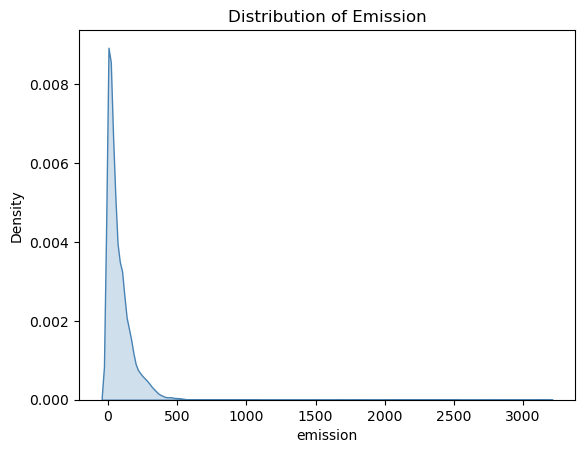

In [12]:
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

#plotting the emission distribution 
sns.kdeplot(data = train_df, x = 'emission', fill = True, color = 'steelblue',).set_title('Distribution of Emission');

from the graph we could clearly see that the highest distribution are between 100 to 200

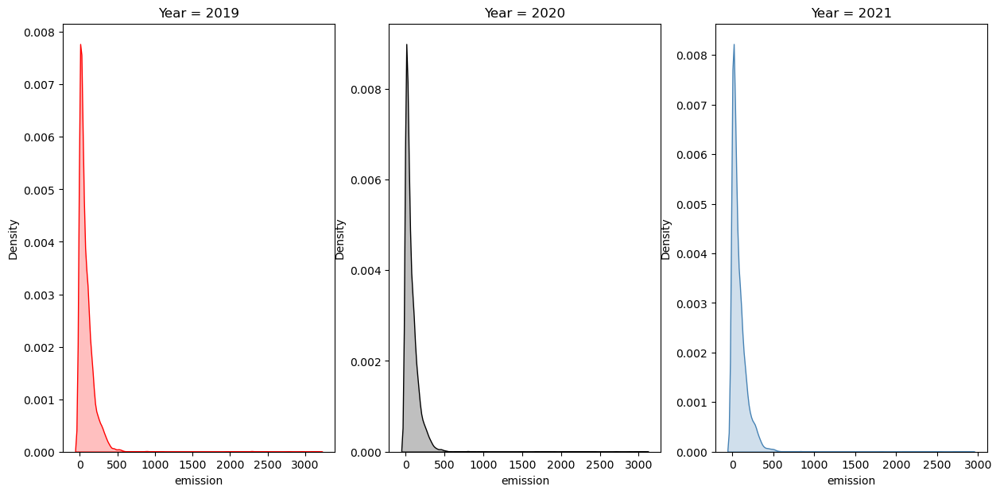

In [13]:
#visualizing the emission distribution across the years 
fig, axes = plt.subplots(1, 3, figsize = (15, 7))

sns.kdeplot(ax = axes[0], data = train_df[train_df['year'] == 2019], x = 'emission', fill = True, color = 'red').set_title('Year = 2019')
sns.kdeplot(ax = axes[1], data = train_df[train_df['year'] == 2020], x = 'emission', fill = True, color = 'black').set_title('Year = 2020')
sns.kdeplot(ax = axes[2], data = train_df[train_df['year'] == 2021], x = 'emission', fill = True, color = 'steelblue').set_title('Year = 2021');


 we can clearly see there is no difference in the distributions across the years. why? well let see the distribution across the weeks

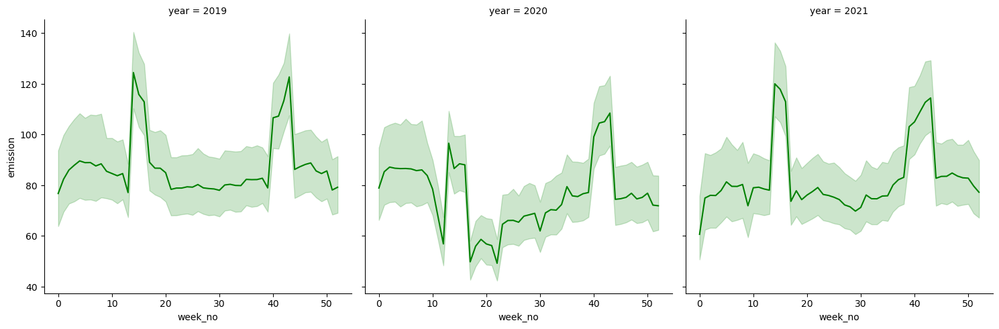

In [14]:
#visualizing the distributions across the weeks 
sns.relplot(data = train_df, x = 'week_no', y = 'emission', col = 'year', kind = 'line', color = 'green');

**from the above visuals, we could see that there are always higher distribution in week 10-20 and week 40-50 respectively**

In [15]:
#visualizing the distribution by regions
import plotly.express as px

fig = px.scatter_mapbox(train_df[train_df['year'] == 2019], 
                        lat = 'latitude', 
                        lon = 'longitude', 
                        color = 'emission',
                        animation_frame = 'week_no',
                        zoom = 6)

fig.update_layout(mapbox_style = "open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show();

fig = px.scatter_mapbox(train_df[train_df['year'] == 2020], 
                        lat = 'latitude', 
                        lon = 'longitude', 
                        color = 'emission',
                        animation_frame = 'week_no',
                        zoom = 6)

fig.update_layout(mapbox_style = "open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show();

fig = px.scatter_mapbox(train_df[train_df['year'] == 2021], 
                        lat = 'latitude', 
                        lon = 'longitude', 
                        color = 'emission',
                        animation_frame = 'week_no',
                        zoom = 6)

fig.update_layout(mapbox_style = "open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show();

In [16]:
#getting rows with null values in both training and testing data
train_df.isnull().sum().head(20), test_df.isnull().sum().head(20)

(ID_LAT_LON_YEAR_WEEK                                  0
 latitude                                              0
 longitude                                             0
 year                                                  0
 week_no                                               0
 SulphurDioxide_SO2_column_number_density          14609
 SulphurDioxide_SO2_column_number_density_amf      14609
 SulphurDioxide_SO2_slant_column_number_density    14609
 SulphurDioxide_cloud_fraction                     14609
 SulphurDioxide_sensor_azimuth_angle               14609
 SulphurDioxide_sensor_zenith_angle                14609
 SulphurDioxide_solar_azimuth_angle                14609
 SulphurDioxide_solar_zenith_angle                 14609
 SulphurDioxide_SO2_column_number_density_15km     14609
 CarbonMonoxide_CO_column_number_density            2122
 CarbonMonoxide_H2O_column_number_density           2122
 CarbonMonoxide_cloud_height                        2122
 CarbonMonoxide_sensor_altitude

we can see that we have null values so we either drop it or fill it, so in my case i'm filling the rows with low null values and dropping the rows with higher missing values

# 3. CLEANING THE DATASETS AND FEATURE ENGINEERING

In [17]:
train_df.columns

Index(['ID_LAT_LON_YEAR_WEEK', 'latitude', 'longitude', 'year', 'week_no',
       'SulphurDioxide_SO2_column_number_density',
       'SulphurDioxide_SO2_column_number_density_amf',
       'SulphurDioxide_SO2_slant_column_number_density',
       'SulphurDioxide_cloud_fraction', 'SulphurDioxide_sensor_azimuth_angle',
       'SulphurDioxide_sensor_zenith_angle',
       'SulphurDioxide_solar_azimuth_angle',
       'SulphurDioxide_solar_zenith_angle',
       'SulphurDioxide_SO2_column_number_density_15km',
       'CarbonMonoxide_CO_column_number_density',
       'CarbonMonoxide_H2O_column_number_density',
       'CarbonMonoxide_cloud_height', 'CarbonMonoxide_sensor_altitude',
       'CarbonMonoxide_sensor_azimuth_angle',
       'CarbonMonoxide_sensor_zenith_angle',
       'CarbonMonoxide_solar_azimuth_angle',
       'CarbonMonoxide_solar_zenith_angle',
       'NitrogenDioxide_NO2_column_number_density',
       'NitrogenDioxide_tropospheric_NO2_column_number_density',
       'NitrogenDioxide

In [18]:
train_df.dtypes

ID_LAT_LON_YEAR_WEEK           object
latitude                      float64
longitude                     float64
year                            int64
week_no                         int64
                               ...   
Cloud_sensor_azimuth_angle    float64
Cloud_sensor_zenith_angle     float64
Cloud_solar_azimuth_angle     float64
Cloud_solar_zenith_angle      float64
emission                      float64
Length: 76, dtype: object

In [19]:
#dropping all columns with larger missing values as they are not needed for the training
for cols in train_df.columns:
    if cols.startswith('UvAerosol'):
        train_df.drop([cols], axis=1, inplace=True)

#repeating the same step for the test dataset
for cols in test_df.columns:
    if cols.startswith('UvAerosol'):
        test_df.drop([cols], axis=1, inplace=True)

In [20]:
train_df.columns, test_df.columns #checking the columns

(Index(['ID_LAT_LON_YEAR_WEEK', 'latitude', 'longitude', 'year', 'week_no',
        'SulphurDioxide_SO2_column_number_density',
        'SulphurDioxide_SO2_column_number_density_amf',
        'SulphurDioxide_SO2_slant_column_number_density',
        'SulphurDioxide_cloud_fraction', 'SulphurDioxide_sensor_azimuth_angle',
        'SulphurDioxide_sensor_zenith_angle',
        'SulphurDioxide_solar_azimuth_angle',
        'SulphurDioxide_solar_zenith_angle',
        'SulphurDioxide_SO2_column_number_density_15km',
        'CarbonMonoxide_CO_column_number_density',
        'CarbonMonoxide_H2O_column_number_density',
        'CarbonMonoxide_cloud_height', 'CarbonMonoxide_sensor_altitude',
        'CarbonMonoxide_sensor_azimuth_angle',
        'CarbonMonoxide_sensor_zenith_angle',
        'CarbonMonoxide_solar_azimuth_angle',
        'CarbonMonoxide_solar_zenith_angle',
        'NitrogenDioxide_NO2_column_number_density',
        'NitrogenDioxide_tropospheric_NO2_column_number_density',
     

In [21]:
#filling null values
train_df.fillna(0, inplace=True), test_df.fillna(0, inplace=True)

(None, None)

In [22]:
#checking for null values
train_df.isnull().sum().sum(), test_df.isnull().sum().sum()

(0, 0)

In [23]:
#importing preprocessor
from sklearn.preprocessing import OneHotEncoder 
from sklearn.preprocessing import RobustScaler
#encoding the training and testing datasets
train_df.drop('ID_LAT_LON_YEAR_WEEK', axis=1, inplace=True)
test_df.drop('ID_LAT_LON_YEAR_WEEK', axis=1, inplace=True)
enc = OneHotEncoder().fit_transform(train_df, test_df)
rob = RobustScaler().fit_transform(train_df, test_df)

In [24]:
from sklearn.model_selection import train_test_split
#training features
X = train_df.drop('emission', axis=1)
y = train_df.emission

X_train, X_val, y_train, y_val = train_test_split(X, y, random_state=0, test_size=0.20)

In [25]:
#modelling
from xgboost import XGBRegressor
from sklearn.metrics import r2_score
from sklearn.metrics import mean_squared_error

#first model
model_1 = XGBRegressor(objective ='reg:squarederror', n_estimators = 10, seed = 42, random_state=0, learning_rate=1.0).fit(X_train, y_train)
preds_model_1 = model_1.predict(X_val)
mse_1 = np.sqrt(mean_squared_error(y_val, preds_model_1))
acc_1 = r2_score(y_val, preds_model_1)
print("Mean squared error: ", mse_1)
print("Accuracy: ", acc_1)

Mean squared error:  36.69393569630637
Accuracy:  0.9378035438183954


In [26]:
#2nd model
from sklearn.ensemble import BaggingRegressor
from sklearn.tree import DecisionTreeRegressor

estimator = DecisionTreeRegressor(max_depth=5)
model_2 = BaggingRegressor(estimator=estimator, n_estimators=10, random_state=0).fit(X_train, y_train)
preds_model_2 = model_2.predict(X_val)
mse_2 = np.sqrt(mean_squared_error(y_val, preds_model_2))
acc_2 = r2_score(y_val, preds_model_2)
print("Mean squared error: ", mse_2)
print("Accuracy: ", acc_2)

Mean squared error:  102.81270428083367
Accuracy:  0.5117181130543262


In [27]:
#3rd model
from sklearn.ensemble import RandomForestRegressor

model_3 = RandomForestRegressor(n_estimators=100, random_state=0).fit(X_train, y_train)
preds_model_3 = model_3.predict(X_val)
mse_3 = np.sqrt(mean_squared_error(y_val, preds_model_3))
acc_3 = r2_score(y_val, preds_model_3)
print("Mean squared error: ", mse_3)
print("Accuracy: ", acc_3)

Mean squared error:  21.378116204364776
Accuracy:  0.9788886543695697


### so far Randomforest seems to perform better than the other models, so, let's try it on our test data

# Predictions

In [28]:
test_preds = model_3.predict(test_df)
test_preds

array([ 3.61987769,  3.89043362,  4.19472804, ..., 26.57565868,
       27.63118139, 25.59847971])

In [29]:
submission  = pd.read_csv('playground-series-s3e20/sample_submission.csv')
submission['emission'] = test_preds
submission.head(10)

,ID_LAT_LON_YEAR_WEEK,emission
0,ID_-0.510_29.290_2022_00,3.619878
1,ID_-0.510_29.290_2022_01,3.890434
2,ID_-0.510_29.290_2022_02,4.194728
3,ID_-0.510_29.290_2022_03,4.083719
4,ID_-0.510_29.290_2022_04,3.982778
5,ID_-0.510_29.290_2022_05,4.177870
6,ID_-0.510_29.290_2022_06,4.144687
7,ID_-0.510_29.290_2022_07,3.838517
8,ID_-0.510_29.290_2022_08,3.668390
9,ID_-0.510_29.290_2022_09,4.129205


In [30]:
submission.to_csv('submission.csv', index=False)

<Axes: >

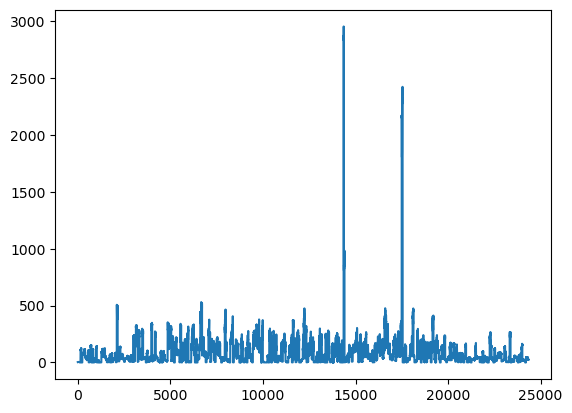

In [43]:
sns.lineplot(test_preds)